# Mobile Price Prediction 

## Introduction 
In today's competitive smartphone market, predicting the price range of a mobile phone based on its features is crucial for manufacturers, retailers, and consumers. This project aims to analyze various mobile specifications—such as battery power, RAM, camera quality, processor speed, and connectivity features. Using machine learning techniques, we will explore how different attributes influence pricing and develop a model to accurately classify new mobile devices. This project will help in market analysis, customer segmentation, and competitive pricing strategies.

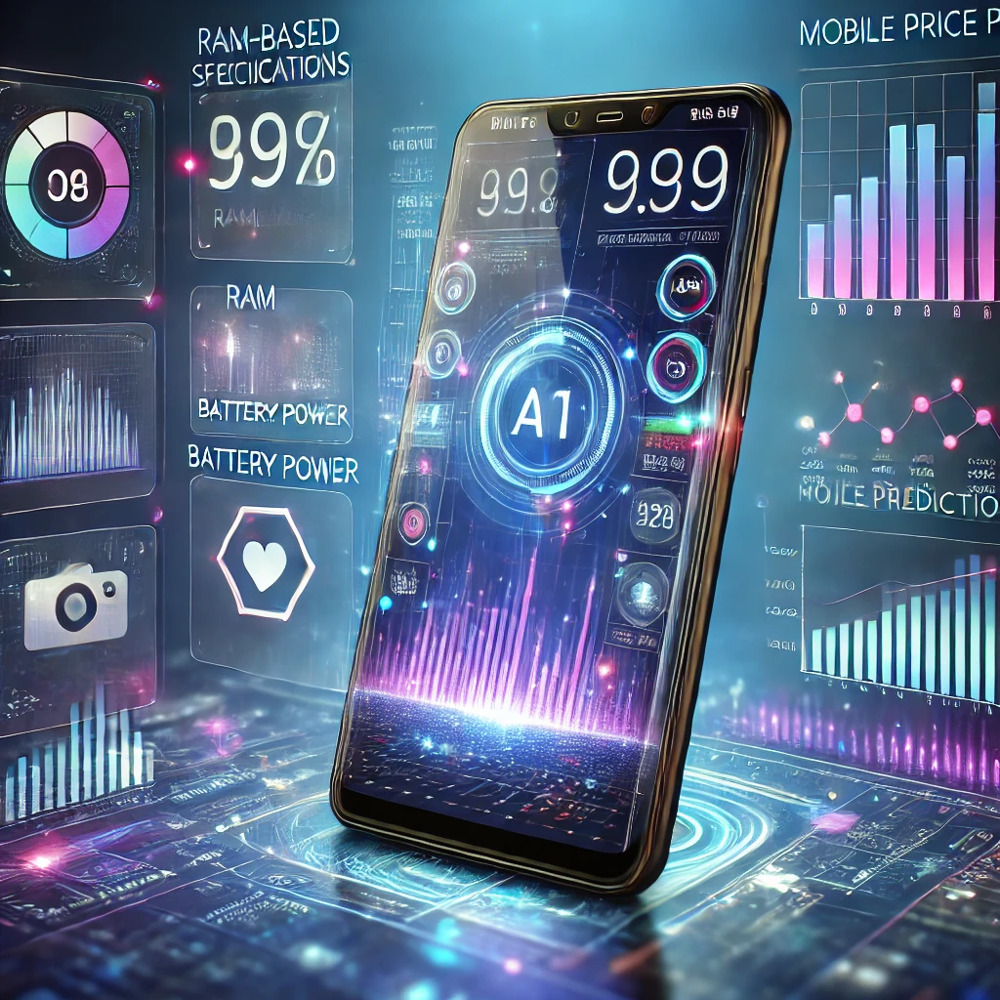

## Problem statement
This project aims to develop a machine learning model that can predict the price range of a mobile device based on its technical specifications. By analyzing key features and their impact on pricing, the model will classify smartphones into predefined price categories: Low, Medium, High, or Very High. The goal is to enhance decision-making for manufacturers, assist customers in making informed purchases, and optimize competitive pricing strategies in the market.

## Project aim :
### 1. Develop a Predictive Model – 
Build a machine learning model that accurately classifies mobile phones into predefined price ranges (Low, Medium, High, Very High) based on their specifications.

### 2. Feature Impact Analysis – 
Identify and analyze the most influential features (e.g., RAM, battery power, camera, processor) that affect mobile pricing to gain insights into the pricing strategy.

### 3. Enhance Decision-Making – 
Provide a data-driven approach for manufacturers, retailers, and consumers to make informed decisions about smartphone pricing and purchasing.

### Importing Libraries 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

In [2]:
df=pd.read_csv('Mobile.csv')
df

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0


battery_power: Total energy capacity of the battery (mAh).

blue: Whether the phone has Bluetooth (1 = Yes, 0 = No).

clock_speed: The speed at which the processor executes instructions (GHz).

dual_sim: Whether the phone supports dual SIM (1 = Yes, 0 = No).

fc: Front camera megapixels.

four_g: Whether the phone supports 4G (1 = Yes, 0 = No).

int_memory: Internal storage capacity (GB).

m_dep: Mobile depth in cm.

mobile_wt: Weight of the mobile phone (grams).

n_cores: Number of processor cores.

pc: Primary camera megapixels.

px_height: Height of the screen resolution (pixels).

px_width: Width of the screen resolution (pixels).

ram: Random Access Memory (MB).

sc_h: Screen height (cm).

sc_w: Screen width (cm).

talk_time: Maximum talk time battery supports (hours).

three_g: Whether the phone supports 3G (1 = Yes, 0 = No).

touch_screen: Whether the phone has a touch screen (1 = Yes, 0 = No).

wifi: Whether the phone has WiFi (1 = Yes, 0 = No).

price_range (Target Column): The price range of the mobile (Categorical: 0 = Low, 1 = Medium, 2 = High, 3 = Very High).

# Basic Checks 

In [3]:
df.shape

(2000, 21)

### There are 2000 rows and 21 columns 

In [4]:
df.dtypes

battery_power      int64
blue               int64
clock_speed      float64
dual_sim           int64
fc                 int64
four_g             int64
int_memory         int64
m_dep            float64
mobile_wt          int64
n_cores            int64
pc                 int64
px_height          int64
px_width           int64
ram                int64
sc_h               int64
sc_w               int64
talk_time          int64
three_g            int64
touch_screen       int64
wifi               int64
price_range        int64
dtype: object

### There are all numeric columns 

In [5]:
df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


## First 5 rows 

In [6]:
df.tail()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0
1999,510,1,2.0,1,5,1,45,0.9,168,6,...,483,754,3919,19,4,2,1,1,1,3


## Last 5 rows 

In [7]:
df.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

## These are the types of columns

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

### This is the general regarding the non null value counts and the datatypes

In [9]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
battery_power,2000.0,1238.51850,439.418206,501.0,851.75,1226.0,1615.25,1998.0
blue,2000.0,0.49500,0.500100,0.0,0.00,0.0,1.00,1.0
clock_speed,2000.0,1.52225,0.816004,0.5,0.70,1.5,2.20,3.0
dual_sim,2000.0,0.50950,0.500035,0.0,0.00,1.0,1.00,1.0
fc,2000.0,4.30950,4.341444,0.0,1.00,3.0,7.00,19.0
four_g,2000.0,0.52150,0.499662,0.0,0.00,1.0,1.00,1.0
int_memory,2000.0,32.04650,18.145715,2.0,16.00,32.0,48.00,64.0
m_dep,2000.0,0.50175,0.288416,0.1,0.20,0.5,0.80,1.0
mobile_wt,2000.0,140.24900,35.399655,80.0,109.00,141.0,170.00,200.0
n_cores,2000.0,4.52050,2.287837,1.0,3.00,4.0,7.00,8.0


## Insights
1. Battery_power : The minimum battery power is 501 and maximum power is 1998
2. int_memory : The minimum memory is of 2 gb and highest is of 64 gb
3. ram : The minimum ram given is 256 and maximum is 3998

In [10]:
num_data = df.select_dtypes(include=["float64","int64"])
print("numerical columns",num_data.columns)

numerical columns Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')


In [11]:
cat_data=df.select_dtypes(include=["O"])
print("categorical columns",cat_data.columns)

categorical columns Index([], dtype='object')


## There are no categorical columns 

# EDA 

## Univariant Analysis 

In [12]:
import ydata_profiling as pp
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## There are no missing values and no duplicates 

In [13]:
count= df.price_range.value_counts()
print(count)

price_range
1    500
2    500
3    500
0    500
Name: count, dtype: int64


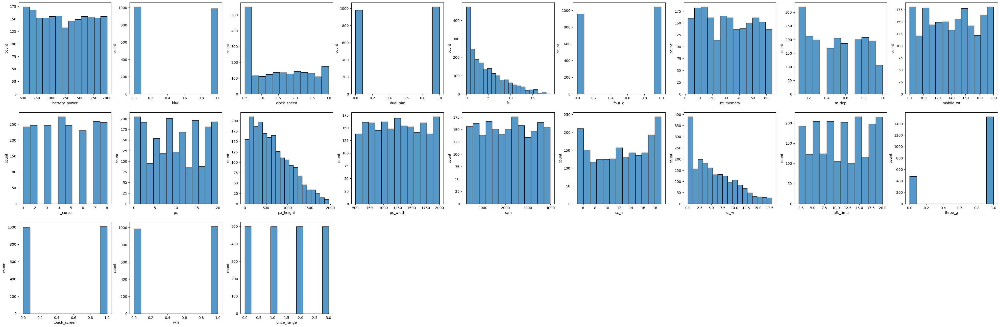

In [14]:
plt.figure(figsize=(50,50),facecolor='white')
plotnumber=1

for column in df:
  if plotnumber<=81:
    ax=plt.subplot(9,9,plotnumber)
    sns.histplot(x=df[column])
    plt.xlabel(column,fontsize=10)
    plt.ylabel("count",fontsize=10)
  plotnumber+=1
plt.show()

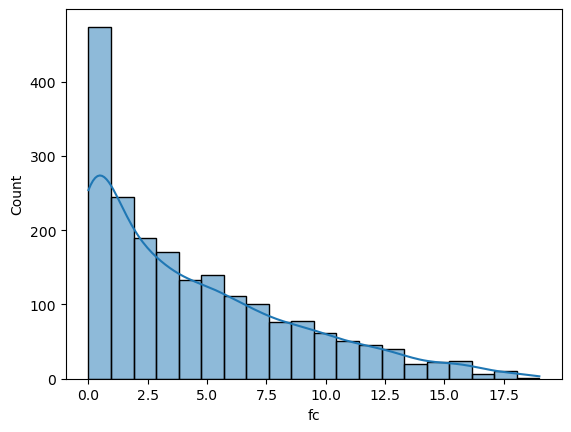

In [15]:
sns.histplot(x=df['fc'],kde=True)
plt.show()

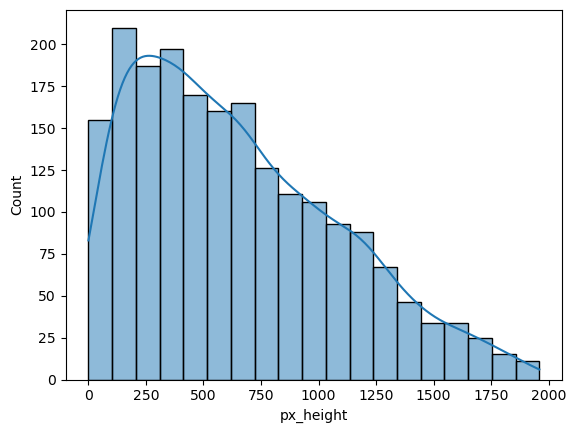

In [16]:
sns.histplot(x=df['px_height'],kde=True)
plt.show()

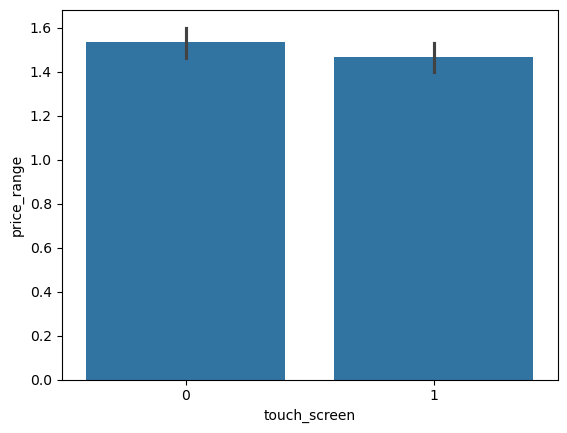

In [17]:
sns.barplot(x=df['touch_screen'],y=df['price_range'])
plt.show()

## Bivariate Analysis

In [18]:
num_data.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

In [19]:
d1=df[['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range']]

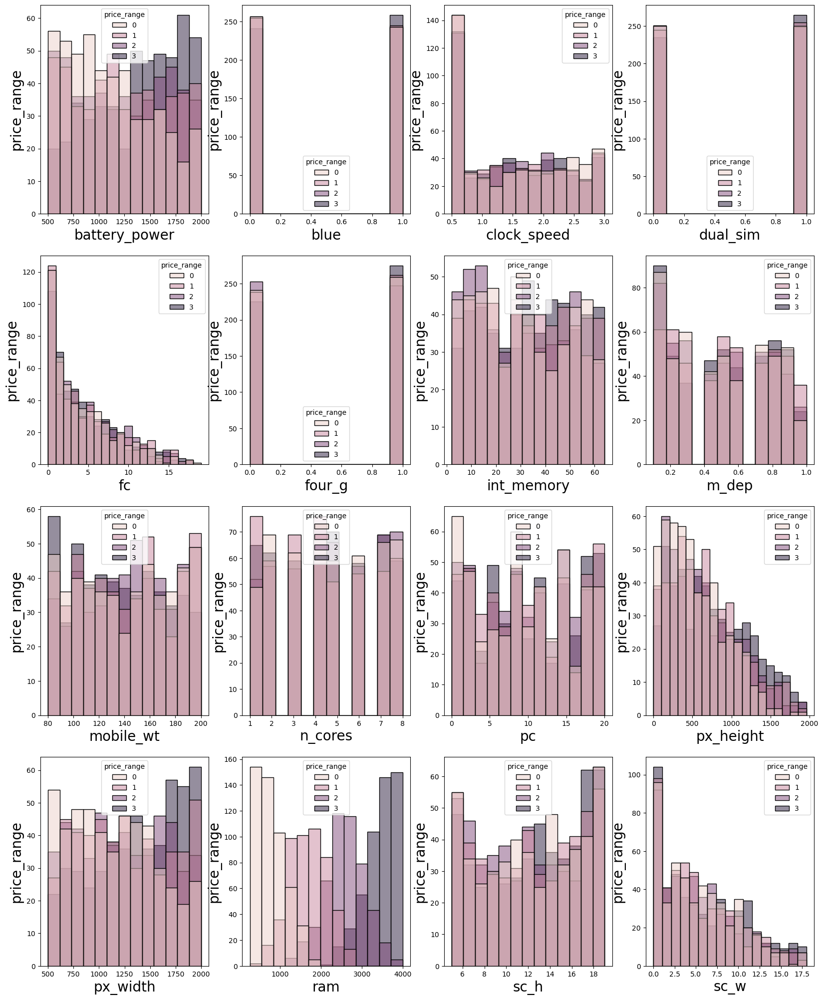

In [20]:
# Plotting how every  numerical feature correlate with the "target"
plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1

for column in d1:
    if plotnumber<=16 :
        ax = plt.subplot(4,4,plotnumber)
        sns.histplot(x=d1[column]         
                        ,hue=df.price_range)
        plt.xlabel(column,fontsize=20)
        plt.ylabel('price_range',fontsize=20)
    plotnumber+=1
plt.show()

# Data Preprocessing

In [21]:
df.isnull().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

### There are no missing values

## Checking for outliers

In [22]:
num_data

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0


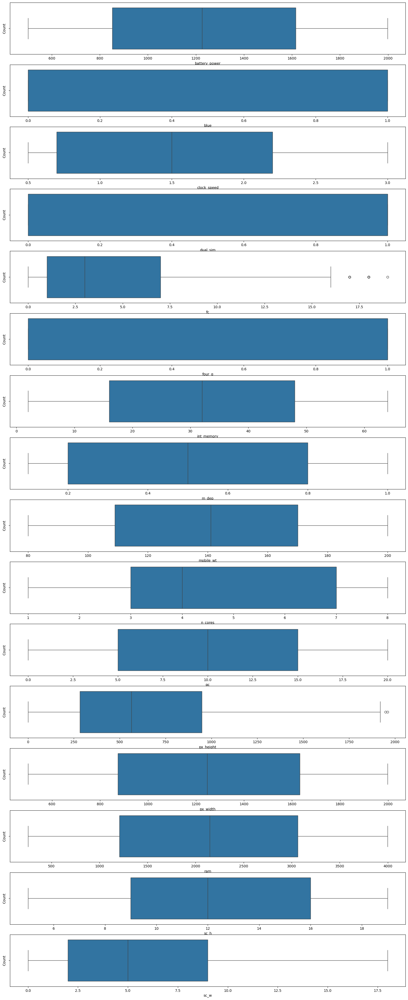

In [23]:
plt.figure(figsize=(20,50),facecolor='white')
plotnumber=1

for column in num_data:
  if plotnumber<=16:
    ax=plt.subplot(16,1,plotnumber)
    sns.boxplot(x=df[column])
    plt.xlabel(column,fontsize=10)
    plt.ylabel('Count',fontsize=10)
  plotnumber+=1
plt.show()

### There are approximately no outliers

# Feature Engineering 

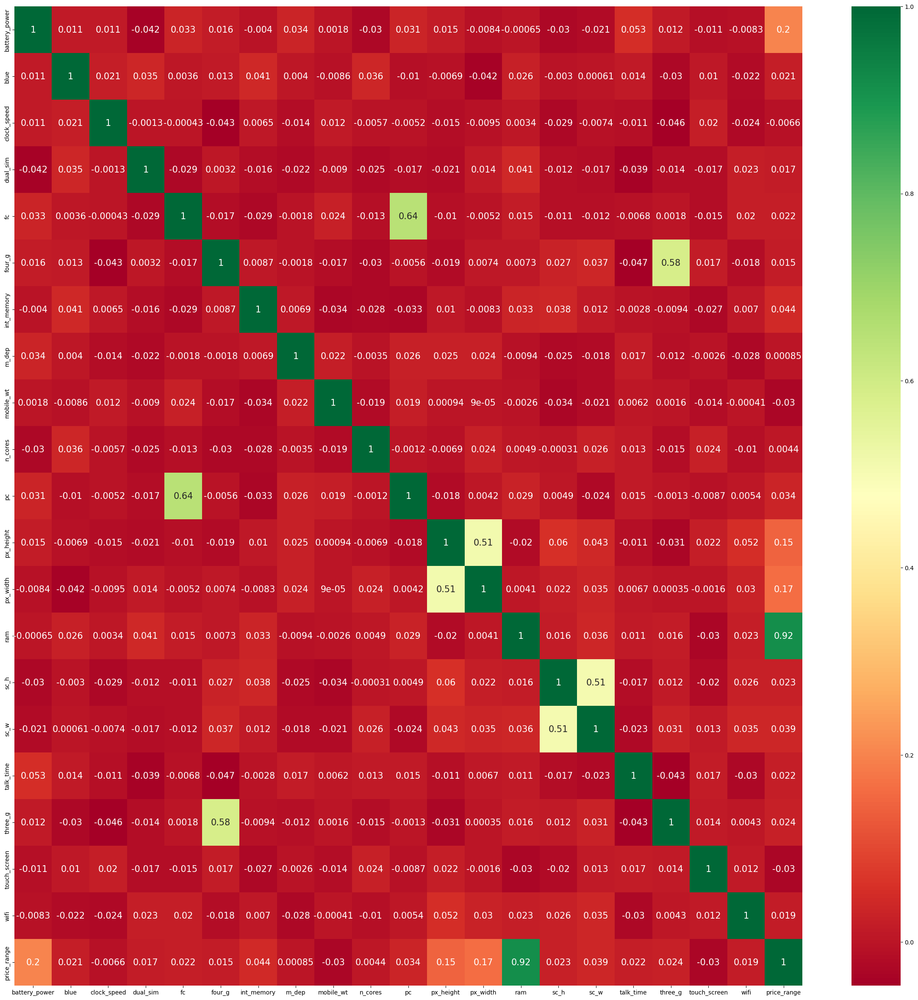

In [24]:
plt.figure(figsize=(30, 30))
sns.heatmap(df.corr(), annot=True, cmap="RdYlGn", annot_kws={"size":15})
plt.show()

### The highest corelated values are battery power , px_height , px_width and ram

# Model Building

In [25]:
## Split data into x and y
x = df[['battery_power','ram','px_height','px_width']]
y = df.price_range

In [26]:
## training and testing data
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=42)

In [27]:
x_train

,battery_power,ram,px_height,px_width
968,1923,1489,767,1759
240,633,3560,529,1009
819,1236,1406,517,809
692,781,3508,304,1674
420,1456,1587,823,1104
...,...,...,...,...
1130,1975,3022,775,1607
1294,589,362,759,1858
860,1829,2080,729,1267
1459,1927,2916,491,1506


In [28]:
x_test

,battery_power,ram,px_height,px_width
1860,1646,686,211,1608
353,1182,2563,275,986
1333,1972,1316,293,952
905,989,3892,256,1394
1289,615,1906,1021,1958
...,...,...,...,...
965,1379,3912,387,671
1284,991,2014,1209,1678
1739,1044,1794,1230,1263
261,728,2039,526,1529


In [29]:
y_train

968     1
240     2
819     0
692     3
420     1
       ..
1130    3
1294    0
860     2
1459    3
1126    1
Name: price_range, Length: 1600, dtype: int64

In [30]:
y_test

1860    0
353     2
1333    1
905     3
1289    1
       ..
965     3
1284    2
1739    1
261     1
535     2
Name: price_range, Length: 400, dtype: int64

In [31]:

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

linear_regressor = LinearRegression()
linear_regressor.fit(x_train, y_train)

y_pred = linear_regressor.predict(x_test)

mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

r2 = r2_score(y_test, y_pred)
print("R-squared (R2) score:", r2)


Mean Squared Error: 0.10529061046120738
R-squared (R2) score: 0.9210859256704726


In [32]:

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

model = RandomForestRegressor()
model.fit(x_train, y_train)

y_pred = model.predict(x_test)


mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)


r2 = r2_score(y_test, y_pred)
print("R-squared (R2) score:", r2)



Mean Squared Error: 0.06260375
R-squared (R2) score: 0.953079225591276


In [33]:

from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score


GB = GradientBoostingRegressor(n_estimators=700)
GB.fit(x_train, y_train)

y_pred = GB.predict(x_test)

mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)


r2 = r2_score(y_test, y_pred)
print("R-squared (R2) score:", r2)


Mean Squared Error: 0.08445102221117268
R-squared (R2) score: 0.9367049519915888


In [34]:

from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score

knn_regressor = KNeighborsRegressor(n_neighbors=10)
knn_regressor.fit(x_train, y_train)

y_pred = knn_regressor.predict(x_test)

mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

r2 = r2_score(y_test, y_pred)
print("R-squared (R2) score:", r2)


Mean Squared Error: 0.0463
R-squared (R2) score: 0.9652986944851718


In [35]:
error_rate=[]
for k in range(1,11):
  KNN=KNeighborsRegressor(n_neighbors=k)
  KNN.fit(x_train,y_train)
  y_pred=KNN.predict(x_test)
  error_rate.append(np.mean(y_pred!=y_test))
error_rate

[0.0675, 0.1425, 0.1825, 0.2475, 0.3075, 0.345, 0.3825, 0.42, 0.4425, 0.4525]

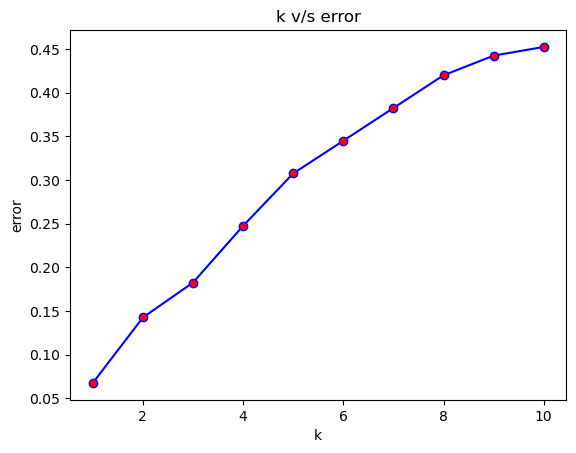

In [36]:
plt.plot(range(1,11),error_rate,color='blue',marker="o",markerfacecolor='red')
plt.xlabel("k")
plt.ylabel("error")
plt.title("k v/s error")
plt.show()